# A data analysis and spatial mapping of 2006-2018 NYC arrests
### [Anthony Xiang](http://www.github.com/anthonyxiang1)

Taking a look at dates, demographics, and locations of arrests in NYC &ndash; both generally and over time &ndash; with pandas, seaborn, and folium libraries.

## [Table of Contents] <a name="top"></a>
1. [Initial Exploration](#introduction)
2. [Data Cleaning](#paragraph1)
    1. [Change data types](#subparagraph1)
    2. [Handling NA values](#subparagraph2)
3. [Inspecting Available Data / Simple Analysis](#paragraph2)
    1. [Offense](#subparagraph3)
    2. [Borough](#subparagraph4)
    3. [Age](#subparagraph5)
    4. [Gender](#subparagraph6)
    5. [Race](#subparagraph7)
    6. [Latitude/Longitude](#subparagraph8)
    7. [Date](#subparagraph9)
4. [Exploratory Data Analysis](#paragraph4)
    1. [Offense and Borough](#subparagraph4-1)
    2. [Offense and Race](#subparagraph4-2)
    3. [Offense and Sex](#subparagraph4-3)
    4. [Offense and Age Group](#subparagraph4-4)
    5. [Race and Borough arrest count](#subparagraph4-5)
    6. [Gender and Age Group for each Borough](#subparagraph4-6)
    7. [Race Proportion Comparison](#subparagraph4-7)
5. [Time Series Analysis](#paragraph5)
    1. [Yearly](#subparagraph5-1)
    4. [Drug Arrests by Year](#subparagraph5-4)
    5. [Arrest Rates by Borough](#subparagraph5-5)
6. [Spatial Mapping](#paragraph6)
    1. [All Arrests](#subparagraph6-1)
    2. [Heatmap](#subparagraph6-2)
    3. [Interactive Plot](#subparagraph6-3)
    4. [Cluster Plot](#subparagraph6-4)
7. [Decision Tree](#paragraph7)
8. [Limitations](#paragraph8)
9. [Conclusion](#paragraph9)

## Initial Exploration  <a name="introduction"></a>
[Back to top](#top)

We have data from 2006 to 2018, all cases in the year.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import datetime
from matplotlib.colors import LogNorm
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap
df = pd.read_csv(r'C:\Users\s4rme\Desktop\jupyterPy\NYCArrests.csv')

In [2]:
df.shape

(4798339, 18)

In [3]:
df.sort_values(by=['ARREST_DATE'], ascending=False).head(5)

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude
4551583,191681569,12/31/2018,478.0,"THEFT OF SERVICES, UNCLASSIFIED",343.0,OTHER OFFENSES RELATED TO THEFT,PL 1651503,M,Q,103,6.0,18-24,M,BLACK,1037598.0,194471.0,40.700302,-73.807603
4551669,191701416,12/31/2018,339.0,"LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED",341.0,PETIT LARCENY,PL 1552500,M,M,18,0.0,18-24,M,BLACK,991531.0,217373.0,40.763320,-73.973718
4551662,191681571,12/31/2018,905.0,"INTOXICATED DRIVING,ALCOHOL",347.0,INTOXICATED & IMPAIRED DRIVING,VTL11920U3,M,Q,113,0.0,25-44,M,BLACK,1049338.0,187649.0,40.681499,-73.765329
4551663,191691980,12/31/2018,113.0,"MENACING,UNCLASSIFIED",344.0,ASSAULT 3 & RELATED OFFENSES,PL 1201401,M,B,45,0.0,25-44,M,WHITE HISPANIC,1032930.0,239207.0,40.823118,-73.824114
4551664,191692013,12/31/2018,748.0,"CONTEMPT,CRIMINAL",359.0,OFFENSES AGAINST PUBLIC ADMINISTRATION,PL 2155002,M,M,32,0.0,25-44,M,BLACK,999428.0,236544.0,40.815930,-73.945167


In [4]:
df.sort_values(by=['ARREST_DATE'], ascending=False).tail(5)

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude
4551199,9958067,01/01/2006,759.0,"PUBLIC ADMINISTATION,UNCLASS MISDEMEAN 4",359.0,OFFENSES AGAINST PUBLIC ADMINISTRATION,PL 1950500,M,B,41,72.0,25-44,M,BLACK,1017934.0,232221.0,40.804013,-73.878332
4551198,9930330,01/01/2006,503.0,"CONTROLLED SUBSTANCE,INTENT TO SELL 3",117.0,DANGEROUS DRUGS,PL 2201601,F,S,120,0.0,<18,M,BLACK,954652.0,170721.0,40.635225,-74.106642
4551197,9930318,01/01/2006,101.0,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,S,120,0.0,18-24,F,BLACK,959914.0,162076.0,40.611512,-74.087652
4551196,9930309,01/01/2006,198.0,CRIMINAL CONTEMPT 1,126.0,MISCELLANEOUS PENAL LAW,PL 21551B5,F,Q,101,0.0,18-24,M,WHITE HISPANIC,1051464.0,159247.0,40.603526,-73.757947
4551159,9927086,01/01/2006,961.0,"SIGNAL,FAIL TO",881.0,OTHER TRAFFIC INFRACTION,VTL116300A,I,Q,112,0.0,25-44,M,WHITE HISPANIC,1025420.0,202485.0,40.722364,-73.851474


## Data Cleaning <a name="paragraph1"></a>
[Back to top](#top)

our analysis will focus on arrest date, offense, demographics (age group, sex, race), and latitude/longitude - let's drop some columns that we don't need.

In [5]:
df.drop(df.columns[[0,2,3,4,6,7,10,14,15]], axis=1, inplace=True)

df.head()

,ARREST_DATE,OFNS_DESC,ARREST_BORO,ARREST_PRECINCT,AGE_GROUP,PERP_SEX,PERP_RACE,Latitude,Longitude
0,12/31/2017,MISCELLANEOUS PENAL LAW,Q,105,25-44,M,BLACK,40.735772,-73.715638
1,12/31/2017,OTHER OFFENSES RELATED TO THEFT,Q,114,25-44,M,ASIAN / PACIFIC ISLANDER,40.769437,-73.910241
2,12/31/2017,OTHER STATE LAWS,K,73,18-24,M,BLACK,40.679525,-73.904572
3,12/31/2017,ASSAULT 3 & RELATED OFFENSES,M,18,25-44,M,WHITE,40.763523,-73.987074
4,12/31/2017,ASSAULT 3 & RELATED OFFENSES,M,18,45-64,M,BLACK,40.759768,-73.989811


### Change data types <a name="subparagraph1"></a>

Change arrest date to datetime object.

In [6]:
df.iloc[:,0] = pd.to_datetime(df.iloc[:,0], format="%m/%d/%Y")
df.dtypes

ARREST_DATE        datetime64[ns]
OFNS_DESC                  object
ARREST_BORO                object
ARREST_PRECINCT             int64
AGE_GROUP                  object
PERP_SEX                   object
PERP_RACE                  object
Latitude                  float64
Longitude                 float64
dtype: object

### Handling NA values <a name="subparagraph2"></a>

In [7]:
df.isna().sum()

ARREST_DATE           0
OFNS_DESC          8870
ARREST_BORO           8
ARREST_PRECINCT       0
AGE_GROUP            17
PERP_SEX              0
PERP_RACE             0
Latitude              1
Longitude             1
dtype: int64

In [8]:
df[df['Latitude'].isna()]
df = df.drop([3986591])

In [9]:
dfArrestNA = df[df['ARREST_BORO'].isna()]

# we can fill in these boroughs manually using the latitudes and longitudes

dfArrestNA = dfArrestNA.assign(ARREST_BORO = ['M', 'M', 'M', 'K', 'K', 'B', 'M', 'M'])

In [10]:
df = dfArrestNA.combine_first(df)

In [11]:
df.isna().sum()

ARREST_DATE           0
OFNS_DESC          8870
ARREST_BORO           0
ARREST_PRECINCT       0
AGE_GROUP            17
PERP_SEX              0
PERP_RACE             0
Latitude              0
Longitude             0
dtype: int64

In [12]:
dfFirstClean = df
dfFirstClean.shape

(4798338, 9)

## Inspecting Available Data / Simple Analysis <a name="paragraph2"></a>
[Back to top](#top)

Questions to answer:


1. How many male arrests were there?
2. Which borough had the most arrests?
3. What demographic is arrested the most?

### Offense <a name="subparagraph3"></a>

We find that the biggest crime in New York City is drug related, more than doubling the second biggest offense.

<strong>Interesting</strong>: 12 people were arrested for fortune telling.

In [13]:
offense = dfFirstClean.iloc[:,1].value_counts(dropna=False).reset_index()
offense.columns = ['OFNS_DESC', 'count']

offense.head()

,OFNS_DESC,count
0,DANGEROUS DRUGS,1056377
1,ASSAULT 3 & RELATED OFFENSES,459889
2,OTHER OFFENSES RELATED TO THEFT,304191
3,OTHER STATE LAWS,240418
4,CRIMINAL TRESPASS,196181


Text(0, 0.5, 'Crime Count')

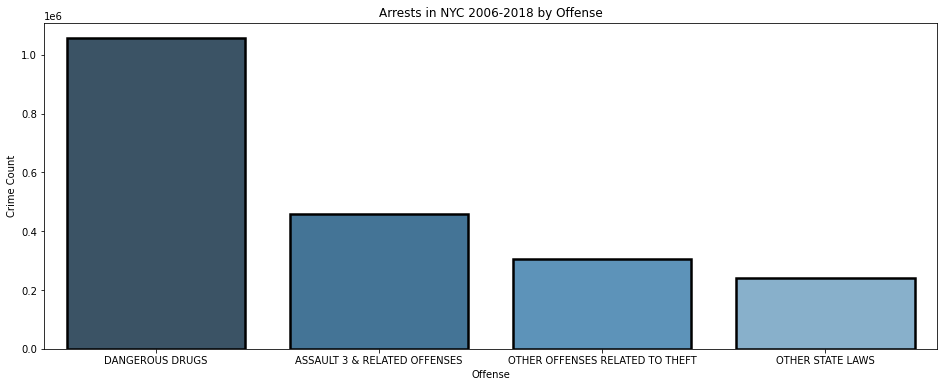

In [14]:
plt.figure(figsize=(16,6))
sns.barplot(x = 'OFNS_DESC', y='count', data=offense[0:4], palette="Blues_d", linewidth=2.5, edgecolor="0")
plt.title('Arrests in NYC 2006-2018 by Offense')
plt.xlabel('Offense')
plt.ylabel('Crime Count')

### Borough <a name="subparagraph4"></a>

Brooklyn has the most offenses, closely followed by Manhattan. Staten Island has far less.

Finding the arrest rate (arrest / population) using average arrests over 13 years and population (from Wikipedia, 2017), we see that Manhattan has the highest arrest rate, followed by the Bronx.

This is not the most accurate estimation, but we will later look at yearly arrest rates by borough.

In [15]:
dfFirstClean['ARREST_BORO'].replace('M', 'Manhattan', inplace=True)
dfFirstClean['ARREST_BORO'].replace('K', 'Brooklyn', inplace=True)
dfFirstClean['ARREST_BORO'].replace('B', 'Bronx', inplace=True)
dfFirstClean['ARREST_BORO'].replace('Q', 'Queens', inplace=True)
dfFirstClean['ARREST_BORO'].replace('S', 'Staten Island', inplace=True)

In [16]:
borough = dfFirstClean.iloc[:,2].value_counts(dropna=False).reset_index()
borough.columns = ['ARREST_BORO', 'count']

borough['population2017'] = [2648771, 1664727, 1471160, 2358582, 479458]
borough['arrestRateAvg'] = borough['count'] / 13 / borough['population2017']

borough

,ARREST_BORO,count,population2017,arrestRateAvg
0,Brooklyn,1334916,2648771,0.038767
1,Manhattan,1303791,1664727,0.060245
2,Bronx,1097368,1471160,0.057378
3,Queens,895902,2358582,0.029219
4,Staten Island,166361,479458,0.026691


Text(0, 0.5, 'Crime Count')

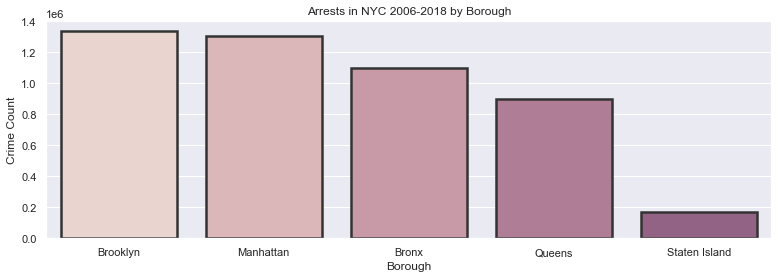

In [17]:
plt.figure(figsize=(13,4))
sns.set(style="darkgrid")
sns.barplot(x = 'ARREST_BORO', y='count', data=borough, palette=sns.cubehelix_palette(8), linewidth=2.5, edgecolor=".2")
plt.title('Arrests in NYC 2006-2018 by Borough')
plt.xlabel('Borough')
plt.ylabel('Crime Count')

### Age <a name="subparagraph5"></a>

We have some weird inputs here (3 digit ages??). Let's focus on the first 5 age groups.

We see an interesting bell curve, where most arrests are of middle ages 24-44.

In [18]:
dfFirstClean.iloc[:,4].value_counts(dropna=False).head(10)

25-44    2202168
18-24    1274229
45-64     880740
<18       402008
65+        38998
NaN           17
895           13
945            7
935            7
894            7
Name: AGE_GROUP, dtype: int64

In [19]:
dfFirstClean = dfFirstClean[(dfFirstClean['AGE_GROUP'] == '25-44') | (dfFirstClean['AGE_GROUP'] == '18-24') |
           (dfFirstClean['AGE_GROUP'] == '45-64') | (dfFirstClean['AGE_GROUP'] == '<18') |
           (dfFirstClean['AGE_GROUP'] == '65+')]

age = dfFirstClean.iloc[:,4].value_counts(dropna=False).reset_index()
age.columns = ['AGE_GROUP', 'count']

age

,AGE_GROUP,count
0,25-44,2202168
1,18-24,1274229
2,45-64,880740
3,<18,402008
4,65+,38998


Text(0, 0.5, 'Crime Count')

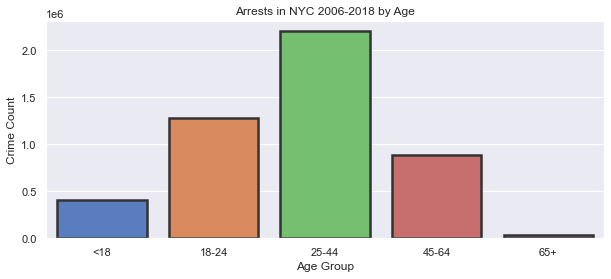

In [20]:
plt.figure(figsize=(10,4))
sns.set(style="darkgrid")
sns.barplot(x = 'AGE_GROUP', y='count', data=age, palette="muted", linewidth=2.5, edgecolor=".2", order=['<18', '18-24', '25-44', '45-64', '65+'])
plt.title('Arrests in NYC 2006-2018 by Age')
plt.xlabel('Age Group')
plt.ylabel('Crime Count')

### Gender <a name="subparagraph6"></a>

Males commit almost 5 times as many crimes as females in the dataset.

In [21]:
gender = dfFirstClean.iloc[:,5].value_counts(dropna=False).reset_index()
gender.columns = ['GENDER', 'count']

gender

,GENDER,count
0,M,3996087
1,F,802056


Text(0, 0.5, 'Crime Count')

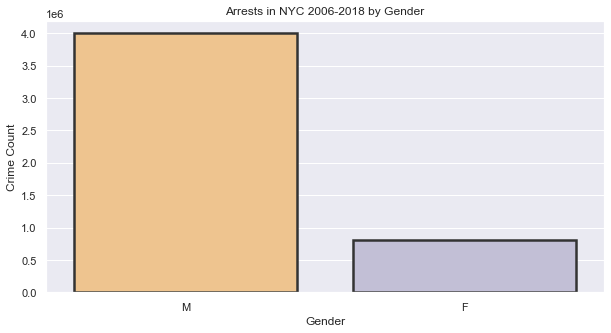

In [22]:
plt.figure(figsize=(10,5))
sns.set(style="darkgrid")
sns.barplot(x = 'GENDER', y='count', data=gender, palette="PuOr", linewidth=2.5, edgecolor=".2")
plt.title('Arrests in NYC 2006-2018 by Gender')
plt.xlabel('Gender')
plt.ylabel('Crime Count')

### Race <a name="subparagraph7"></a>

We see that black and white hispanics are the biggest racial groups being arrested. This is disproportionate to the percent of the demographic in NYC. We will investigate this later.

In [23]:
race = dfFirstClean.iloc[:,6].value_counts(dropna=False).reset_index()
race.columns = ['RACE', 'count']

race

,RACE,count
0,BLACK,2330829
1,WHITE HISPANIC,1249817
2,WHITE,579397
3,BLACK HISPANIC,384270
4,ASIAN / PACIFIC ISLANDER,193093
5,UNKNOWN,48921
6,AMERICAN INDIAN/ALASKAN NATIVE,10453
7,OTHER,1363


<AxesSubplot:title={'center':'Arrests in NYC 2006-2018 by Race'}, xlabel='RACE', ylabel='count'>

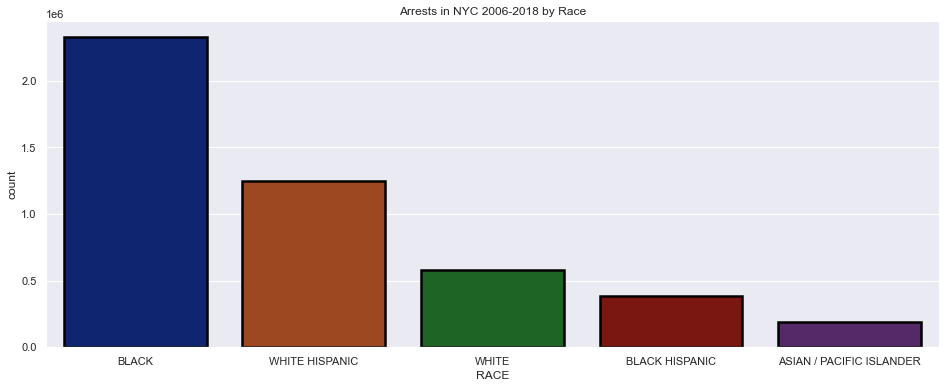

In [24]:
plt.figure(figsize=(16,6))
plt.title('Arrests in NYC 2006-2018 by Race')
plt.xlabel('Race')
plt.ylabel('Crime Count')
sns.set(style="darkgrid")
sns.barplot(x = 'RACE', y='count', data=race[0:5], palette="dark", linewidth=2.5, edgecolor="0")

### Latitude/Longitude <a name="subparagraph8"></a>

Latitude max is abnormally high (the most eastern part of NYC is around 40.75 degrees). We see that there are actually a lot of values that are not in the NYC latitude/longitude range (over 2 million). We can't do much to gain that information otherwise, so we will have to settle with the accurate spatial points.

In [25]:
df.describe()

,ARREST_PRECINCT,Latitude,Longitude
count,4.798338e+06,4.798338e+06,4.798338e+06
mean,6.054391e+01,4.075731e+01,-7.392378e+01
std,3.427400e+01,4.551971e-01,7.194385e-02
min,1.000000e+00,4.049891e+01,-7.425494e+01
25%,3.300000e+01,4.067967e+01,-7.396705e+01
50%,5.200000e+01,4.074196e+01,-7.392549e+01
75%,8.400000e+01,4.081609e+01,-7.388618e+01
max,1.230000e+02,6.208307e+01,-7.368178e+01


In [26]:
len(df[df['Latitude'] > 40.75].sort_values(by='Latitude'))

2232342

### Date <a name="subparagraph9"></a>

<strong> That is really neat! The days with the least arrests are often near Christmas time. 12 of the 20 days of least arrests are on Christmas. This is interesting because crime often spikes during the holiday season. My guess is that NYC police are less present or more lenient during the holidays.  </strong>

In [27]:
date = dfFirstClean.iloc[:,0].value_counts(dropna=False).reset_index()
date.columns = ['DATE', 'count']

date.tail(20)

,DATE,count
4728,2016-01-24,230
4729,2010-12-26,224
4730,2014-12-24,224
4731,2017-03-14,217
4732,2008-12-25,216
4733,2007-12-25,214
4734,2016-12-25,213
4735,2014-12-31,212
4736,2011-12-25,211
4737,2018-11-22,199


In [28]:
dfFullClean = dfFirstClean.dropna()

## Exploratory Data Analysis <a name="paragraph4"></a>

[Back to top](#top)

Questions to answer:
1. What are the most common offenses by borough, sex, age, race? How do they differ between groups?
2. How do the two genders compare by borough, age, race?



We have dfFirstClean - with NA values in offense - and dfFullClean which is fully cleaned. We will use the cleaned dataset from now on so that we have no interfering missing values.

In [29]:
dfFullClean.head()

,ARREST_DATE,OFNS_DESC,ARREST_BORO,ARREST_PRECINCT,AGE_GROUP,PERP_SEX,PERP_RACE,Latitude,Longitude
0,2017-12-31,MISCELLANEOUS PENAL LAW,Queens,105.0,25-44,M,BLACK,40.735772,-73.715638
1,2017-12-31,OTHER OFFENSES RELATED TO THEFT,Queens,114.0,25-44,M,ASIAN / PACIFIC ISLANDER,40.769437,-73.910241
2,2017-12-31,OTHER STATE LAWS,Brooklyn,73.0,18-24,M,BLACK,40.679525,-73.904572
3,2017-12-31,ASSAULT 3 & RELATED OFFENSES,Manhattan,18.0,25-44,M,WHITE,40.763523,-73.987074
4,2017-12-31,ASSAULT 3 & RELATED OFFENSES,Manhattan,18.0,45-64,M,BLACK,40.759768,-73.989811


### Offense and Borough <a name="subparagraph4-1"></a>

Observations:

1. The most common offenses throughout NYC are drug arrests
2. Boroughs with most robbery/burglary are Bronx and Brooklyn
3. Driving crimes occur most often in Queens - reasonable as there is more driving activity there

Text(0.5, 1.0, 'Offenses by Borough')

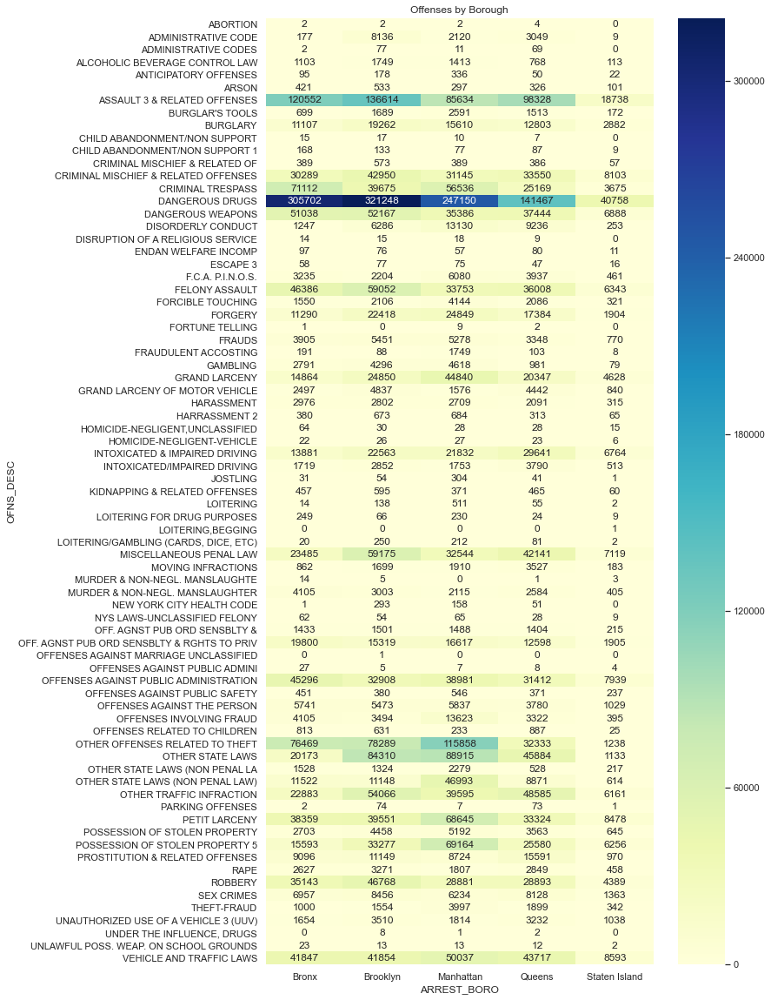

In [30]:
heatmap_boro = pd.crosstab(dfFullClean['OFNS_DESC'], dfFullClean['ARREST_BORO'])

sns.set(rc={'figure.figsize':(10,20)})
sns.heatmap(heatmap_boro, cmap="YlGnBu", annot=True, fmt='g').set_title('Offenses by Borough')

### Offense and Race <a name="subparagraph4-2"></a>

Observations:

1. Blacks are arrested for dangerous drugs almost 4.5 times that of white, non hispanics. Hispanics are arrested for dangerous drugs about 2 times that of white.
2. Similar proportions for assault.

Text(0.5, 1.0, 'Offenses by Race')

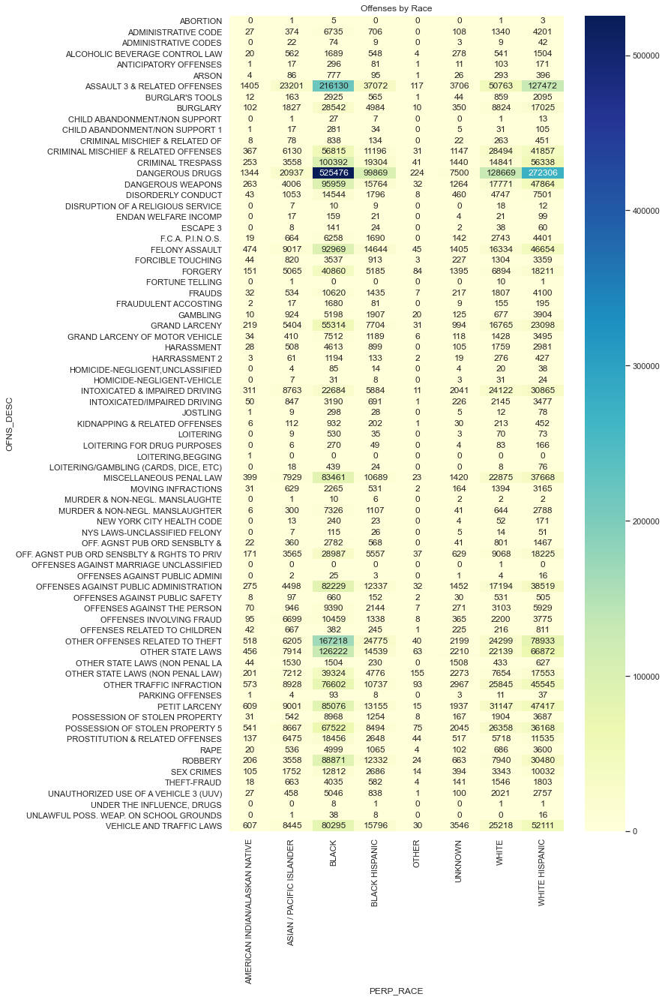

In [31]:
heatmap_race = pd.crosstab(dfFullClean['OFNS_DESC'], dfFullClean['PERP_RACE'])

sns.set(rc={'figure.figsize':(10,20)})
sns.heatmap(heatmap_race, cmap="YlGnBu", annot=True, fmt='g').set_title('Offenses by Race')

### Offense and Sex <a name="subparagraph4-3"></a>

We will use normalized values for each sex to find out what are the most common offenses for each gender. We expect some offenses will be very different.

Observations:

1. High percentage of 3rd degree assault and felony assault in female arrests
2. Female arrests are more likely low level crimes (petit larceny, possession of stolen property) whereas male arrests are higher risk (weapons and theft)

Text(0.5, 1.0, 'Offenses by Sex')

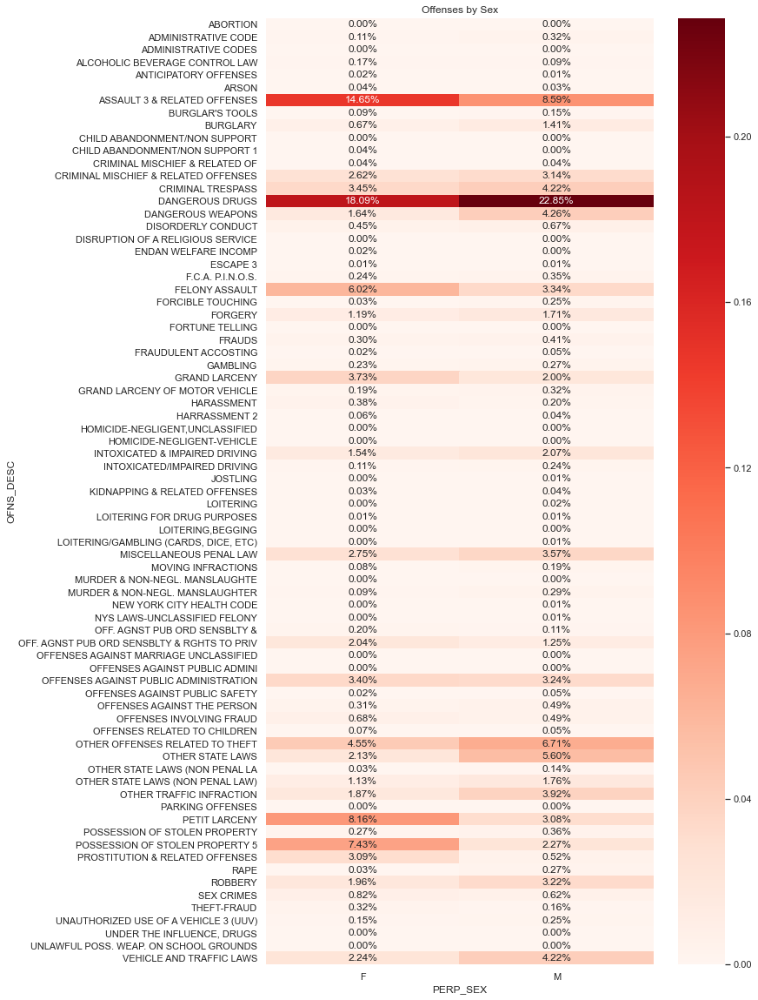

In [32]:
heatmap_gender = pd.crosstab(dfFullClean['OFNS_DESC'], dfFullClean['PERP_SEX'])

for i in range(len(heatmap_gender.columns)):
    heatmap_gender.iloc[:,i] = heatmap_gender.iloc[:,i] / heatmap_gender.iloc[:,i].sum()
    
sns.set(rc={'figure.figsize':(10,20)})
sns.heatmap(heatmap_gender, cmap="Reds", annot=True, fmt='.2%').set_title('Offenses by Sex')

### Offense and Age Group <a name="subparagraph4-4"></a>

Normalizing again, our observations:

1. Most common offenses throughout are drugs and assaults
2. Reasonably, for <18 age group, drugs and stealing crimes (robbery, larceny, theft) are most common





Text(0.5, 1.0, 'Offenses by Age Group')

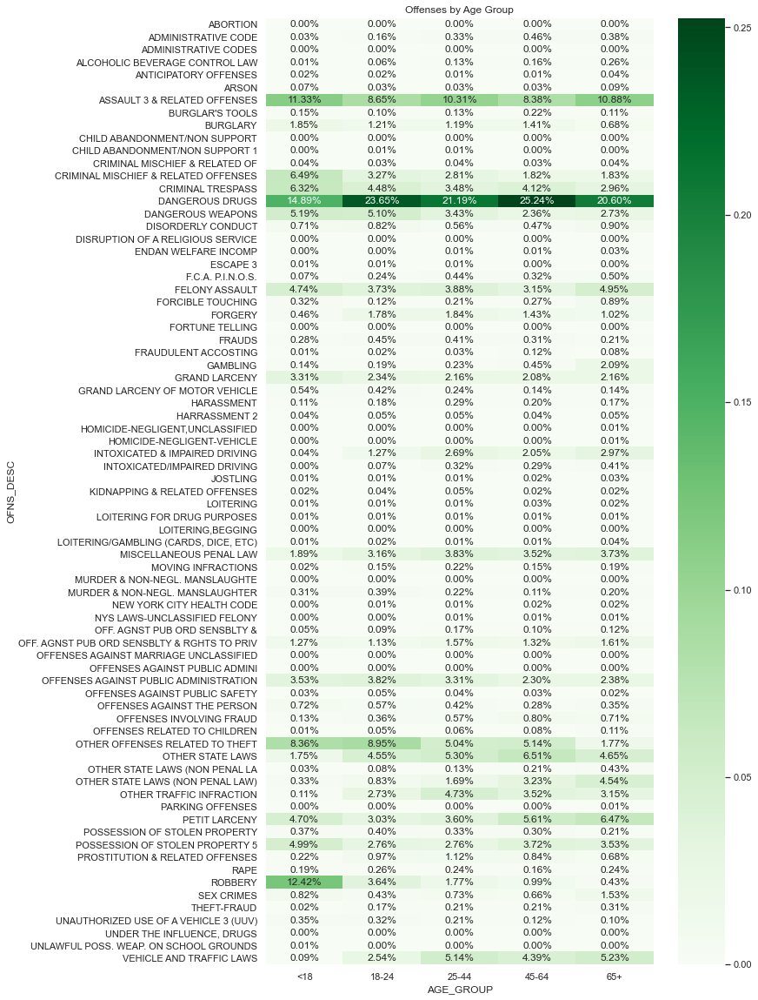

In [33]:
heatmap_age = pd.crosstab(dfFullClean['OFNS_DESC'], dfFullClean['AGE_GROUP'])

for i in range(len(heatmap_age.columns)):
    heatmap_age.iloc[:,i] = heatmap_age.iloc[:,i] / heatmap_age.iloc[:,i].sum()

#move <18 group to the front
heatmap_age = heatmap_age[['<18', '18-24', '25-44', '45-64', '65+']]

sns.set(rc={'figure.figsize':(10,20)})
sns.heatmap(heatmap_age, cmap="Greens", annot=True, fmt='.2%').set_title('Offenses by Age Group')

### Race and Borough arrest count <a name="subparagraph4-5"></a>

<AxesSubplot:xlabel='ARREST_BORO', ylabel='count'>

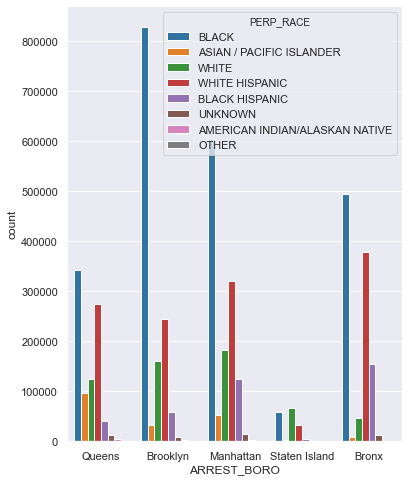

In [34]:
sns.set(rc={'figure.figsize':(6,8)})
sns.countplot(x="ARREST_BORO", hue="PERP_RACE", data=dfFullClean, palette=sns.color_palette("tab10"))

### Race and Age Group for each Borough <a name="subparagraph4-6"></a>

Brooklyn and Bronx has the biggest disparity in black and white drug arrests.

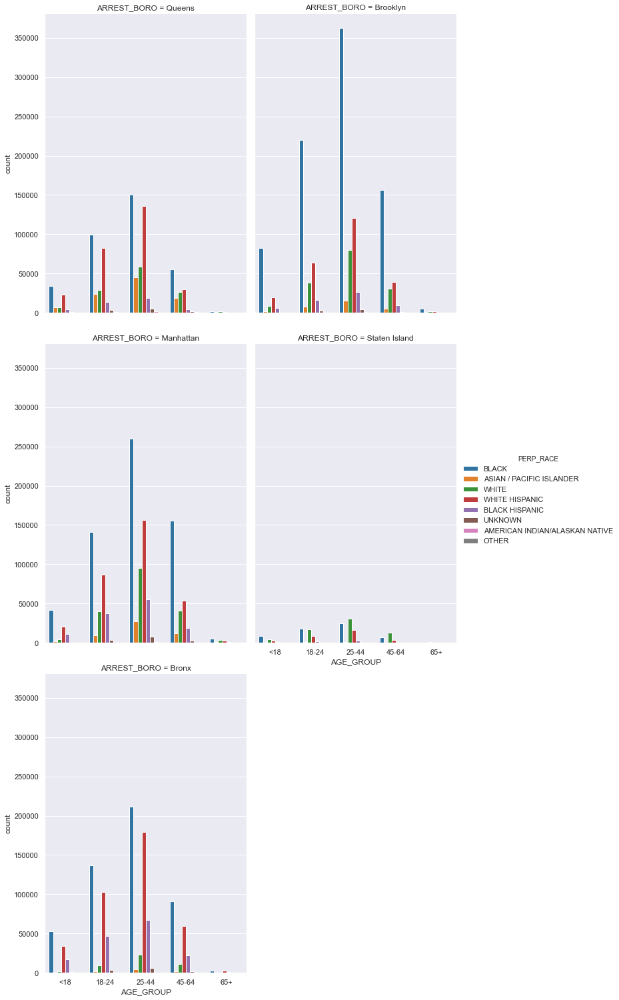

In [35]:
sns.catplot(x="AGE_GROUP", hue="PERP_RACE", order=['<18', '18-24', '25-44', '45-64', '65+'],
                col="ARREST_BORO", data=dfFullClean, kind="count", col_wrap=2, height=7, aspect=.7, palette=sns.color_palette("tab10"));

### Race Proportion Comparison <a name="subparagraph4-7"></a>

Comparing the proportion of races in arrest dataset vs. the proportion of the population in NYC.

Text(0.5, 1.0, 'Relative Proportion of Arrest Victims vs. Population')

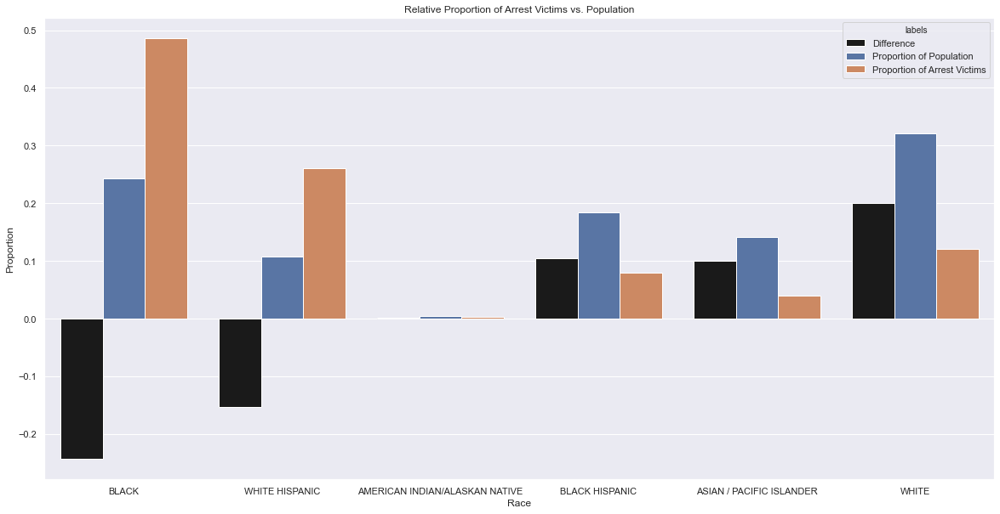

In [36]:
race_df = dfFullClean.iloc[:,6].value_counts(dropna=False).reset_index()
race_df.columns = ['RACE', 'Proportion of Arrest Victims']

race_df['Proportion of Population'] = [.243, .107, .321, .184, .141, 0, .004,0]
race_df['Proportion of Arrest Victims'] = race_df['Proportion of Arrest Victims'] / len(dfFullClean)

race_df['Difference'] = race_df['Proportion of Population'] - race_df['Proportion of Arrest Victims']

race_df = race_df.drop([5,7])

race_df = pd.melt(race_df, id_vars="RACE", var_name="labels", value_name="props")

sns.set(rc={'figure.figsize':(20,10)})
g = sns.barplot(x='RACE',
                y='props',
                hue='labels',
                hue_order=['Difference','Proportion of Population','Proportion of Arrest Victims'], 
                order=['BLACK', 'WHITE HISPANIC','AMERICAN INDIAN/ALASKAN NATIVE',
                       'BLACK HISPANIC','ASIAN / PACIFIC ISLANDER','WHITE'], 
                data=race_df, 
                palette=["k", "C0","C1"])


g.set(xlabel='Race', ylabel='Proportion')
plt.title("Relative Proportion of Arrest Victims vs. Population")


## Time Series Analysis <a name="paragraph5"></a>
[Back to top](#top)

Questions to answer:
1. How did the number of arrests change through the years?
2. What are the trends/patterns within each year? Is there a peak at holidays?
3. Looking at yearly arrest trends for specific crimes - vehicle impairment (is there a peak at holidays/drinking events) and drugs (is there a peak at 4/20)
4. How did the arrest rates change over time by borough?

We use a dictionary to store the dfFullClean dataset into sets of each year. We can dynamically change the indices within the for loop using a dictionary, rather than dynamically creating variables. Now that we are working with smaller datasets, hopefully the maps and plots will be generated faster.

In [37]:
d = {}
for i in range(2006, 2019):
    d['year' + str(i)] = dfFullClean[dfFullClean['ARREST_DATE'].dt.year == i]

### Yearly <a name="subparagraph5-1"></a>

Arrests in NYC have decreased heavily since 2014, cut by more than 150,000 arrests.

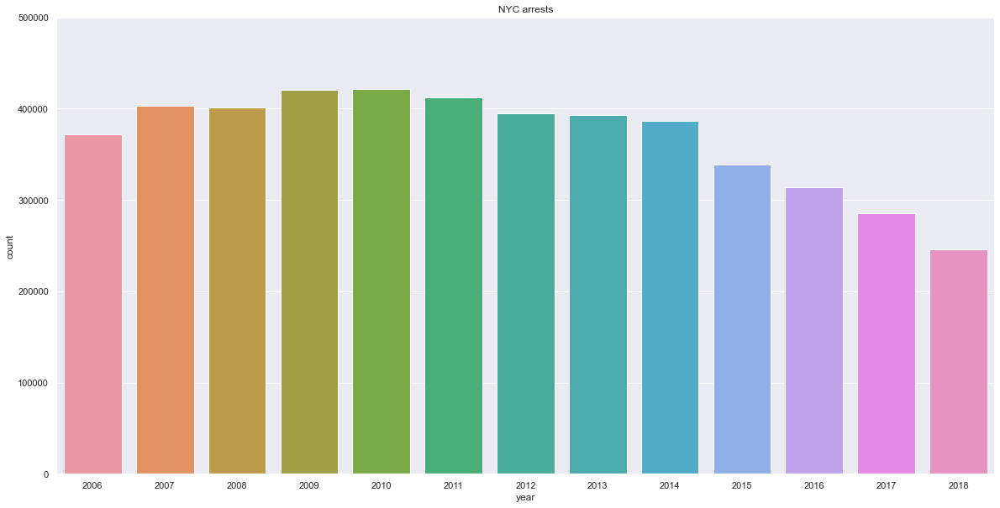

In [38]:
years = [i for i in range(2006, 2019)]
counts = [len(d['year' + str(i)]) for i in range(2006, 2019)]

dictMeta = {'year': years, 'count': counts}

dfMeta = pd.DataFrame(data=dictMeta)

graph = sns.barplot(x="year", y="count", data=dfMeta)
graph.set(ylim=(0,500000))
graph.set(title="NYC arrests")
sns.set(rc={'figure.figsize':(8,13)})

### Arrest Rates by Borough <a name="subparagraph5-5"></a>

Using the 2010 census data for population as an estimate. Bronx and Manhattan arrest rates are similar in 2018, so is Queens and Staten Island.

In [40]:
rates = {}

for i in range(2006, 2019):
    rates['year' + str(i)] = dfFullClean[(dfFullClean['ARREST_DATE'].dt.year == i)]

rates_df = pd.DataFrame()

for key in drug:
    temp = rates[key].iloc[:,2].value_counts(dropna=False).reset_index()
    temp.columns = ['ARREST_BORO', f"{key[4:]}"]

    temp = temp.set_index(temp['ARREST_BORO'])
    temp.drop(temp.columns[[0]], axis=1, inplace=True)

    if rates_df.empty:
        rates_df = temp
    else:
        rates_df = rates_df.merge(temp, how='outer', left_index=True, right_index=True)


In [41]:
borough_pop = [1385108, 2504700, 1585873, 2230722,  468730]

for i in range(len(rates_df)):
    rates_df.iloc[[i]] = (rates_df.iloc[[i]] / borough_pop[i])

In [42]:
rates_df = rates_df.T
rates_df

ARREST_BORO,Bronx,Brooklyn,Manhattan,Queens,Staten Island
2006,0.060535,0.041123,0.064510,0.031474,0.026452
2007,0.069077,0.044463,0.069659,0.032810,0.026472
2008,0.069286,0.043551,0.068850,0.032323,0.032006
2009,0.072011,0.046650,0.072177,0.034085,0.029806
2010,0.072466,0.047043,0.071180,0.034223,0.030414
2011,0.069777,0.046978,0.069774,0.032788,0.029915
2012,0.064726,0.045214,0.068207,0.031808,0.027771
2013,0.061704,0.043706,0.068866,0.033986,0.027094
2014,0.061655,0.042552,0.066664,0.033986,0.028319
2015,0.054277,0.037156,0.058976,0.029413,0.023713


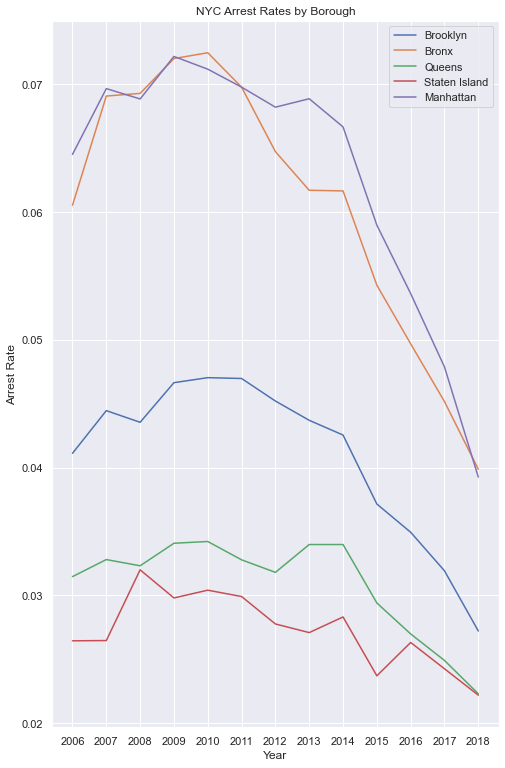

In [43]:
list_data = [rates_df['Brooklyn'], rates_df['Bronx'], rates_df['Queens'], rates_df['Staten Island'], rates_df['Manhattan']]

ax = sns.lineplot(data=list_data, dashes=False)
ax.set(title="NYC Arrest Rates by Borough")
ax.set(xlabel='Year', ylabel='Arrest Rate')
sns.set(rc={'figure.figsize':(15,5)})

## Spatial Mapping <a name="paragraph6"></a>
[Back to top](#top)

The folium maps have trouble rendering the large amount of rows in the datasets.. the largest map only show 20,000 values. There must be better scaling tools for analysis but I enjoyed playing around with folium and making these plots.

Observations:
1. Less crime is committed on the borders of New York City. This is because those areas are more often occupied by affluent residents.
2. The hotspot of crime is located in mid Manhattan.
3. Zooming in on a heatmap, we see hotspots specifically in highly populated locations - Penn Station and Times Square.

### All Arrests <a name="subparagraph6-1"></a>

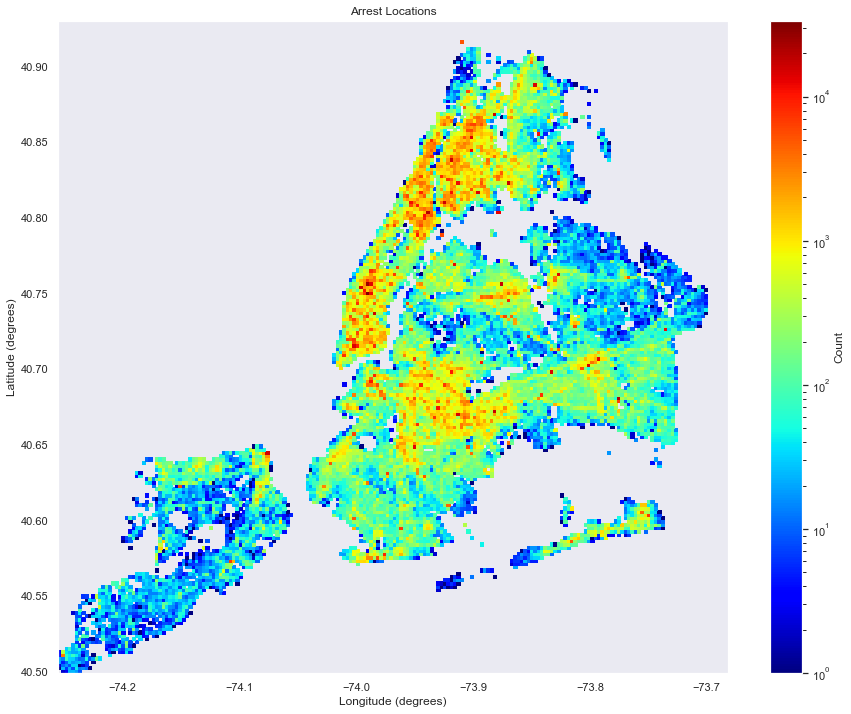

In [44]:
latmin = dfFullClean['Latitude'].min()
lonmin = dfFullClean['Longitude'].min()
latmax = 40.93
lonmax = dfFullClean['Longitude'].max()

fig = plt.figure(1, figsize=(15,12) )
hist = plt.hist2d(dfFullClean['Longitude'],dfFullClean['Latitude'],
                  cmap='jet',bins=200,range=[[lonmin,lonmax],[latmin,latmax]],norm=LogNorm())
plt.xlabel('Longitude (degrees)')
plt.ylabel('Latitude (degrees)')
plt.title('Arrest Locations')
plt.colorbar(label='Count')
plt.show()

### Heatmap - ~13000 values <a name="subparagraph6-2"></a>

Map of drug arrests, white vs. black 2016-2018. Blacks more heavily arrested in Bronx and central Brooklyn areas.

In [45]:
df_druguse_white = dfFullClean[(dfFullClean.OFNS_DESC == "DANGEROUS DRUGS") & 
                         (dfFullClean.PERP_RACE == "WHITE") &
                         (dfFullClean.ARREST_DATE > datetime.datetime(2016, 1, 1))]

df_druguse_black = dfFullClean[(dfFullClean.OFNS_DESC == "DANGEROUS DRUGS") & 
                         (dfFullClean.PERP_RACE == "BLACK") &
                         (dfFullClean.ARREST_DATE > datetime.datetime(2016, 1, 1))]

In [47]:
map = folium.Map(location=[40.738, -73.98], zoom_start=10)

locations = list(zip(df_druguse_white.Latitude, df_druguse_white.Longitude))
icons = [folium.Icon(prefix="fa") for _ in range(len(df_druguse_white))]

map.add_child(HeatMap(df_druguse_white[['Latitude', 'Longitude']].values, radius=15))

map

In [48]:
map = folium.Map(location=[40.738, -73.98], zoom_start=10)

locations = list(zip(df_druguse_black.Latitude, df_druguse_black.Longitude))
icons = [folium.Icon(prefix="fa") for _ in range(len(df_druguse_black))]

map.add_child(HeatMap(df_druguse_black[['Latitude', 'Longitude']].values, radius=15))

map

### Interactive plot - ~800 values <a name="subparagraph6-3"></a>

Map of white drug use arrests in Manhattan in 2018. 

In [49]:
df_druguse = dfFullClean[(dfFullClean.OFNS_DESC == "DANGEROUS DRUGS") & 
                         (dfFullClean.PERP_RACE == "WHITE") &
                         (dfFullClean.ARREST_BORO == "Manhattan") &
                         (dfFullClean.ARREST_DATE > datetime.datetime(2018, 1, 1))]

In [50]:
def plotArrest(dataset):
    # generate a new map
    mapDriving = folium.Map(location=[40.738, -73.98],
                            zoom_start=12,
                            tiles=("CartoDB Positron"),
                            width='50%')

    # for each row in the data, add a cicle marker
    for index, row in dataset.iterrows():

        number = 1
        
        # generate the popup message that is shown on click.
        popup_text = "{}<br> age group: {}<br> race: {}<br>"
        popup_text = popup_text.format(row["ARREST_DATE"],row["AGE_GROUP"],row["PERP_RACE"])
        
        # radius of circles
        radius = 1
          
        color="#0A8A9F" # teal
        
        # add marker to the map
        mapDriving.add_child(folium.CircleMarker(location=(row["Latitude"],
                                                  row["Longitude"]),
                                                radius=radius,
                                                color=color,
                                                popup=popup_text,
                                                fill=False))
        
    return mapDriving
        
plotArrest(df_druguse)

### Cluster plot - ~3500 values <a name="subparagraph6-4"></a>

2018 black drug use in manhattan. Zoom in and click marker to see more details.

In [51]:
df_drugs = dfFullClean[(dfFullClean.OFNS_DESC == "DANGEROUS DRUGS") & 
                         (dfFullClean.PERP_RACE == "BLACK") &
                         (dfFullClean.ARREST_BORO == "Manhattan") &
                         (dfFullClean.ARREST_DATE > datetime.datetime(2018, 1, 1))]
df_drugs

,ARREST_DATE,OFNS_DESC,ARREST_BORO,ARREST_PRECINCT,AGE_GROUP,PERP_SEX,PERP_RACE,Latitude,Longitude
4551635,2018-12-31,DANGEROUS DRUGS,Manhattan,26.0,18-24,M,BLACK,40.812513,-73.952681
4551736,2018-12-31,DANGEROUS DRUGS,Manhattan,32.0,65+,M,BLACK,40.826989,-73.937129
4551739,2018-12-31,DANGEROUS DRUGS,Manhattan,5.0,25-44,M,BLACK,40.716344,-74.001253
4551740,2018-12-31,DANGEROUS DRUGS,Manhattan,14.0,25-44,M,BLACK,40.750022,-73.991339
4552048,2018-12-30,DANGEROUS DRUGS,Manhattan,14.0,45-64,M,BLACK,40.750327,-73.991112
...,...,...,...,...,...,...,...,...,...
4797701,2018-01-02,DANGEROUS DRUGS,Manhattan,33.0,18-24,M,BLACK,40.840793,-73.937199
4797725,2018-01-02,DANGEROUS DRUGS,Manhattan,14.0,45-64,M,BLACK,40.757916,-73.989299
4797805,2018-01-02,DANGEROUS DRUGS,Manhattan,28.0,25-44,M,BLACK,40.807324,-73.949419
4797834,2018-01-02,DANGEROUS DRUGS,Manhattan,33.0,45-64,M,BLACK,40.837577,-73.938594


In [52]:
m = folium.Map(location=[40.738, -73.98], zoom_start=12)

marker_cluster = MarkerCluster().add_to(m)

for index, row in df_drugs.iterrows():
    
    popup_text = "{}<br> gender: {}<br> race: {}<br>"
    popup_text = popup_text.format(row["ARREST_DATE"],row["PERP_SEX"],row["PERP_RACE"])
    
    folium.Marker(
        location=[float(row['Latitude']), float(row['Longitude'])],
        popup = popup_text,
    ).add_to(marker_cluster)

m

## Limitations <a name="paragraph8"></a>
[Back to top](#top)

Of course, our analysis can be improved if we had more accurate/detailed info. There are several big limitations that can be further improved by using/combining other datasets:

1. Incorrect latitude and longitude of many of the arrests
2. Age groups rather than exact ages
3. Broad race categories rather than nationality
4. Limited data point mapping on folium maps due to performance

## Conclusion <a name="paragraph9"></a>
[Back to top](#top)

To highlight some of the things we did from the NYC arrests dataset from 2006 to 2018:

1. Demographic breakdown - age, gender, race - of arrests of the last 13 years
2. Correlations between offenses and demographic data
3. Visualize race disparities in drug arrests
4. Spatial and interactive maps to show exact locations of drug arrests and areas of high/low arrests